In [39]:
import numpy as np
import pandas as pd
import sympy as sp
from scipy.optimize import fsolve
from scipy.integrate import quad
from sympy import symbols,Eq,solve,cos,sin,tan,sqrt,exp,log,Integral,pi,atan2
from scipy.optimize import differential_evolution




In [40]:
p = 0.55
b = p / 2 / np.pi
theta_initial = 16 * 2 * np.pi
time_duration = 300
num_sections = 223
head_length = 341 / 100
body_length = 220 / 100
dlt = (2*27.5) /100  # 板凳交错
section_length = np.array([head_length] + [body_length] * (num_sections - 1))  # 创建一个包含每节板凳长度的数组
distance = section_length-dlt # 计算每节板凳之间的距离
print(distance)

time_range = 140
thetas = np.zeros((140, 224))
r = np.zeros((140, 224))



[2.86 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65
 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65
 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65
 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65
 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65
 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65
 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65
 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65
 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65
 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65
 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65
 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65
 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65
 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65 1.65
 1.65 

In [41]:
# 计算龙头位于最内圈时的时间

# 计算路程
# 定义长度函数(的待积分部分)
def arclength(theta):
    return np.sqrt(b**2 + (b * theta)**2)
# 计算长度
length, _ = quad(arclength, 0, 32*np.pi)
print(length)
# 路程转时间
time_max = length / 1
time_m = float(int(time_max))
print(time_max)
print(time_m)

442.59025643212556
442.59025643212556
442.0


In [42]:
def find_angle(arcl):
    def f(x):
        integral_value, _ = quad(arclength, 32*np.pi, x)
        return  integral_value + arcl
    sol = (fsolve(f, 1.))
    return sol[0]

In [43]:
# 计算300秒后向内100秒的各秒的龙头位置
angles = np.zeros(time_range)
for i in range(0,time_range):
    #print(i)
    timenow = 301 + i
    angles[i] = find_angle(timenow)
    print(-1 * (quad(arclength, theta_initial, angles[i]))[0])
thetas[:, 0] = angles
r[:, 0] = thetas[:, 0] * b
print(r[:, 0])
print(thetas[:, 0])

301.00000000000006
302.00000000000017
303.0
304.0000000000001
304.9999999999999
306.00000000000006
307.00000000000006
308.00000000000006
309.0
310.0
311.0
311.99999999999994
313.0
314.0
314.99999999999994
315.99999999999994
316.99999999999994
318.00000000000006
319.0000000000006
320.0000000000004
321.00000000000017
322.00000000000006
323.00000000000006
324.00000000000006
325.00000000000006
326.0
326.99999999999994
328.0
328.99999999999994
329.99999999999994
330.99999999999994
332.00000000000176
333.0000000000001
333.9999999999997
335.0000000000001
336.0000000000001
336.99999999999994
338.0
339.0000000000001
340.0
341.0000000000001
342.0000000000001
343.00000000000017
344.0000000000002
345.0000000000006
346.00000000000125
347.0000000000024
348.0000000000045
349.000000000008
350.0
350.99999999999994
351.99999999999994
353.00000000000006
354.00000000000006
355.00000000000006
356.00000000000006
356.9999999999999
357.99999999999994
359.00000000000006
359.9999999999999
361.00000000000006
362

In [44]:
def equations(vars, angle_prev, dist):
    angle_i = vars
    eq2 = dist/(p/2/np.pi) - np.sqrt(angle_i**2 + angle_prev**2 - 2 * angle_i * angle_prev * np.cos(angle_prev - angle_i))
    return eq2

In [45]:
for t in range(time_range):
#     # 计算后续每个点的位置
    for k in range(1, num_sections+1):
        theta_prev = thetas[t, k-1]
        dist = distance[k-1]
        
        initial_guess = [theta_prev + 0.5]  # 微调初始角度
        # print(initial_guess)
        sol = fsolve(equations, initial_guess, args=(theta_prev, dist))
        # print(sol)
        # print('\n')
        thetas[t, k] = sol[0]       # 得到龙身点(r, theta)的theta
        r[t, k] = thetas[t, k] * b    # 得到龙身点坐标的r
#     t = int(time_m) - t1

print(thetas, '\t')

[[ 56.83144674  57.41144359  57.74026092 ... 107.74030658 107.91533405
  108.0900774 ]
 [ 56.63010631  57.21220297  57.54216892 ... 107.63460472 107.80980421
  107.98471876]
 [ 56.42804771  57.01226717  57.34339384 ... 107.52880256 107.70417459
  107.87926082]
 ...
 [ 10.06847295  13.38254825  14.84216185 ...  92.36154901  92.56575087
   92.76950173]
 [  8.86863769  12.20421149  13.82054341 ...  92.21562675  92.42015211
   92.62422433]
 [  7.48159237  23.36677511  24.18134739 ...  94.23595215  94.43608776
   94.63579877]] 	


/tmp/ipykernel_408969/3053830596.py:9: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  sol = fsolve(equations, initial_guess, args=(theta_prev, dist))


In [46]:
# 准备工作: 转换出龙身x, y坐标(用于求)
x = np.zeros((time_range, 224))
y = np.zeros((time_range, 224))
for t in range(time_range):
    for i in np.arange(1, 224):
        x[t, i] = r[t, i] * cos(thetas[t, i])
        y[t, i] = r[t, i] * sin(thetas[t, i])

In [47]:
# 按时刻遍历, 查看该时刻的整条龙处处状态, 看龙身是否有重合
# 重合: 确定龙头两个端点, 确定直线方程

# 求出龙头前左右端点位置
head_x = np.zeros(time_range)
head_y = np.zeros(time_range)

for i in range(time_range):
    head_x[i] = r[i, 0] * np.cos(thetas[i, 0])
    head_y[i] = r[i, 0] * np.sin(thetas[i, 0])
    # print( "(", r[i, 0], ",", thetas[i, 0], ")","(", head_x[i], ",",  head_y[i], ")")
    # print(np.sqrt(head_y[i]**2 + head_x[i]**2))
    # print('\n\n')

midhead_x = np.zeros(time_range)
midhead_y = np.zeros(time_range)
lefthead_x = np.zeros(time_range)
lefthead_y = np.zeros(time_range)
righthead_x = np.zeros(time_range)
righthead_y = np.zeros(time_range)

head_orientations = np.zeros(time_range)
for i in range(time_range):
    head_orientations[i] = atan2(y[i, 0]-y[i, 1], x[i, 0]-x[i, 1])
    midhead_x[i] = head_x[i] + (27.5 / 100) * cos(head_orientations[i])
    midhead_y[i] = head_y[i] + (27.5 / 100) * sin(head_orientations[i])
    print("内点:", (head_x[i], head_y[i]))
    print("外中端点", (midhead_x[i], midhead_y[i]))
    print(r[i, 0])
    print(np.sqrt(midhead_x[i]**2 + midhead_y[i]**2))
    print(r[i, 0] - np.sqrt(midhead_x[i]**2 + midhead_y[i]**2))
    
    # print( "(", r[i, 0], ",", thetas[i, 0], ")","(", head_x[i], ",",  head_y[i], ")")
    # print(np.sqrt(head_y[i]**2 + head_x[i]**2))

for i in range(100):
    lefthead_x[i] = midhead_x[i] + 0.15 * cos(head_orientations[i] - np.pi/2)
    lefthead_y[i] = midhead_y[i] + 0.15 * sin(head_orientations[i] - np.pi/2)
    righthead_x[i] = midhead_x[i] - 0.15 * cos(head_orientations[i] - np.pi/2)
    righthead_y[i] = midhead_y[i] - 0.15 * sin(head_orientations[i] - np.pi/2)
# print()

# 坐标转换函数
def polar_to_cartesian(r, theta):
    """将极坐标转换为直角坐标"""
    x = r * np.cos(theta)
    y = r * np.sin(theta)
    return x, y


# 求点到直线距离函数
def find_distance(x, y, x1, y1, x2, y2):
    """求点到直线的距离函数"""
    # 计算直线系数
    A = y2 - y1
    B = x1 - x2
    C = x2 * y1 - x1 * y2
    
    # 计算距离
    distance_point_to_line = abs(A * x + B * y + C) / np.sqrt(A**2 + B ** 2)
    return distance_point_to_line

# 检验坐标转换和求距离函数是否有误
# x0, y0 = polar_to_cartesian(0, 0)
# x1, y1 = polar_to_cartesian(1, 0)
# x2, y2 = polar_to_cartesian(1, np.pi/2)
print('\n')
print(find_distance(4, 1, 5, -0.1, 5.1, -0.098))
# print(find_distance(0, 0, 0, 1, 1, 0))

内点: (np.float64(4.777174547735982), np.float64(1.3880821078515686))
外中端点 (np.float64(4.598333434393893), np.float64(1.1791781677772804))
4.974753119268748
4.747118233752696
0.2276348855160526
内点: (np.float64(4.940699399077717), np.float64(0.40325525470083323))
外中端点 (np.float64(4.724048952967149), np.float64(0.2338811592786232))
4.9571287407622115
4.729834976687404
0.2272937640748074
内点: (np.float64(4.903552585006393), np.float64(-0.594352040236065))
外中端点 (np.float64(4.657579179385656), np.float64(-0.7173239220925955))
4.939441496936233
4.712493758240223
0.22694773869601015
内点: (np.float64(4.666545121778655), np.float64(-1.56409592876221))
外中端点 (np.float64(4.400998383559381), np.float64(-1.635579701893632))
4.921690710311516
4.695094006869165
0.22659670344235128
内点: (np.float64(4.238706999371704), np.float64(-2.466041315095908))
外中端点 (np.float64(3.964228803693054), np.float64(-2.482974126350772))
4.903875691153135
4.677635141837919
0.2262405493152162
内点: (np.float64(3.6370618475923857),

In [48]:
# 按时刻遍历, 查看该时刻的整条龙处处状态, 看龙身是否有重合
# 按时刻为外循环遍历, 内部查看龙的状态使用对每一节的遍历
# 对每一节遍历时, 是龙头对龙身的遍历. 对每节龙身求 龙头两端点到该龙身体的距离
for t in range(time_range):
    flag_crash = False
    for i in np.arange(2, 223): # 遍历的是节,不是点 # 龙节编号0-222, 龙点编号0-222-223
        d1 = find_distance(lefthead_x[t], lefthead_y[t], x[t, i], y[t, i], x[t, i+1], y[t, i+1])
        d2 = find_distance(righthead_x[t], righthead_y[t], x[t, i], y[t, i], x[t, i+1], y[t, i+1])
        
        print('\n', thetas[t, 0])
        print("t = ", t, '\t', "与第", i+1, "节所在直线距离为", '\t', d1)
        print("t = ", t, '\t', "与第", i+1, "节所在直线距离为", d2)
        if (i > 5):
            print("此时左端点坐标", (lefthead_x[t], lefthead_y[t]), "此时右端点坐标", (righthead_x[t], righthead_y[t]), "极坐标", (r[t, 0], thetas[t, 0]))
            print("第", i+1, "节的坐标为", (x[t, i], y[t, i]), (x[t,i+1], y[t, i+1]), "极坐标", (r[t, i], thetas[t, i]))
        
        if (d1 < 0.15) or (d2 < 0.15):
            flag_crash = True
            break
    if (flag_crash == True):
        print('\t\t', t)
        break
 


 56.83144673788221
t =  0 	 与第 3 节所在直线距离为 	 2.7232289295736116
t =  0 	 与第 3 节所在直线距离为 2.860476520720469

 56.83144673788221
t =  0 	 与第 4 节所在直线距离为 	 4.175635430573014
t =  0 	 与第 4 节所在直线距离为 4.391110185196981

 56.83144673788221
t =  0 	 与第 5 节所在直线距离为 	 5.709389510554433
t =  0 	 与第 5 节所在直线距离为 5.980142248220379

 56.83144673788221
t =  0 	 与第 6 节所在直线距离为 	 7.16756166050893
t =  0 	 与第 6 节所在直线距离为 7.465304005138962

 56.83144673788221
t =  0 	 与第 7 节所在直线距离为 	 8.405186857338418
t =  0 	 与第 7 节所在直线距离为 8.699328720328333
此时左端点坐标 (np.float64(4.484385830717008), np.float64(1.2767278659638748)) 此时右端点坐标 (np.float64(4.712281038070778), np.float64(1.081628469590686)) 极坐标 (np.float64(4.974753119268748), np.float64(56.83144673788221))
第 7 节的坐标为 (np.float64(-4.1039988128901115), np.float64(3.1406337429984115)) (np.float64(-4.909600751417915), np.float64(1.7006665500942795)) 极坐标 (np.float64(5.167822226418364), np.float64(59.03706306026902))

 56.83144673788221
t =  0 	 与第 8 节所在直线距离为 	 9.303479790955807

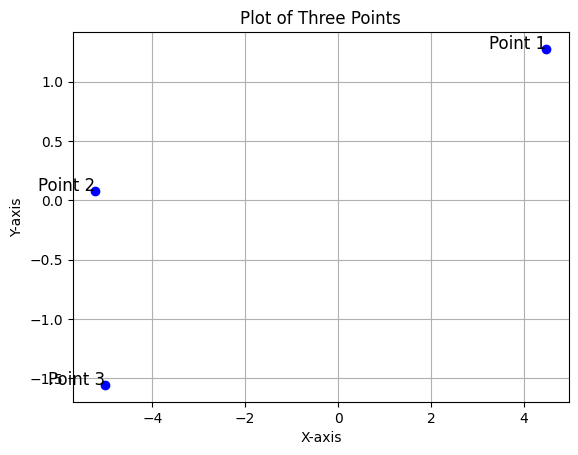

In [49]:
import matplotlib.pyplot as plt

# 定义三个点的坐标
x = [4.484385830717008, -5.223023957637927, -5.015457856409714]
y = [1.2767278659638748, 0.08070794142469245, -1.5561843316406248]

# 绘制点
plt.scatter(x, y, color='blue')

# 添加标签
for i, (xi, yi) in enumerate(zip(x, y)):
    plt.text(xi, yi, f'Point {i+1}', fontsize=12, ha='right')

# 设置标题和坐标轴
plt.title('Plot of Three Points')
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.grid()
plt.show()

In [50]:
print(find_distance(4.484385830717008, 1.2767278659638748, -5.223023957637927, 0.08070794142469245, -5.015457856409714, -1.5561843316406248))

9.780749858645219
